In [ ]:
# Data manipulation
import pandas as pd
import numpy as np

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

# Data preprocessing
from sklearn.model_selection import train_test_split

# Model
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet50, ResNet50_Weights

# Metrics
from sklearn.metrics import balanced_accuracy_score, classification_report, confusion_matrix

# os
import os

# random
import random

# Path
from pathlib import Path

# OrderedDict
from collections import OrderedDict

# tqdm
from tqdm.auto import tqdm

# warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Seed for reproducibility
SEED = 1234
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)

In [ ]:
image_path = Path("/content/drive/MyDrive/Data (1)/Original Dataset")

image_path_list = list(image_path.glob("*/*.jpg"))

print(f'Total Images = {len(image_path_list)}')

Total Images = 917


In [ ]:
labels = os.listdir(image_path)

for label in labels:
  total_images_label = list(Path(os.path.join(image_path, label)).glob("*.jpg"))
  print(f'*{label}: {len(total_images_label)} images')

*Black Spot: 313 images
*Downy Mildew: 200 images
*Fresh Leaf: 404 images


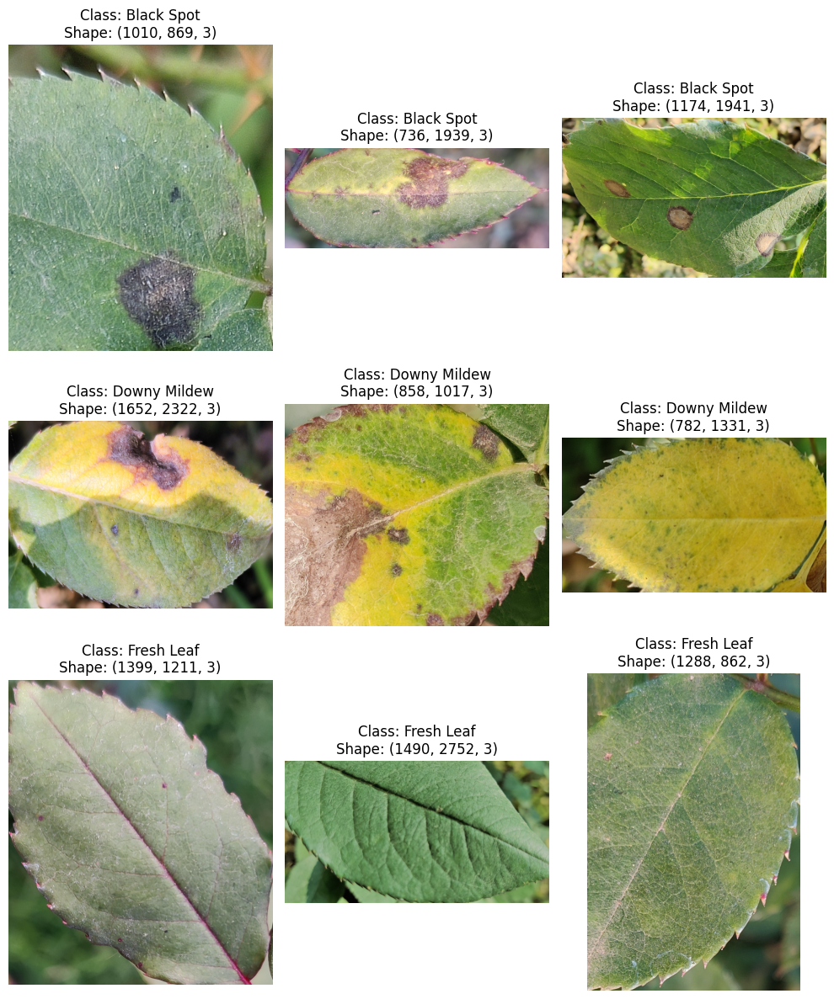

In [ ]:
# Sample visualization
num_images = 3
fig, axs = plt.subplots(nrows=len(labels), ncols=num_images, figsize=(10, 12))
p = 0

for label in labels:
    total_images_label = list(Path(os.path.join(image_path, label)).glob("*.jpg"))
    total_images_selected = random.choices(total_images_label, k=num_images)
    for i, img_path in enumerate(total_images_selected):
        img_bgr = cv2.imread(str(img_path))
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        axs[p, i].imshow(img_rgb)
        axs[p, i].axis('off')
        axs[p, i].set_title(f'Class: {label}\nShape: {img_rgb.shape}', color='black')
    p += 1

fig.tight_layout()
plt.show()

In [ ]:
# Image size distribution
height = []
width = []

for img_path in image_path_list:
    img_bgr = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    height.append(img_rgb.shape[0])
    width.append(img_rgb.shape[1])

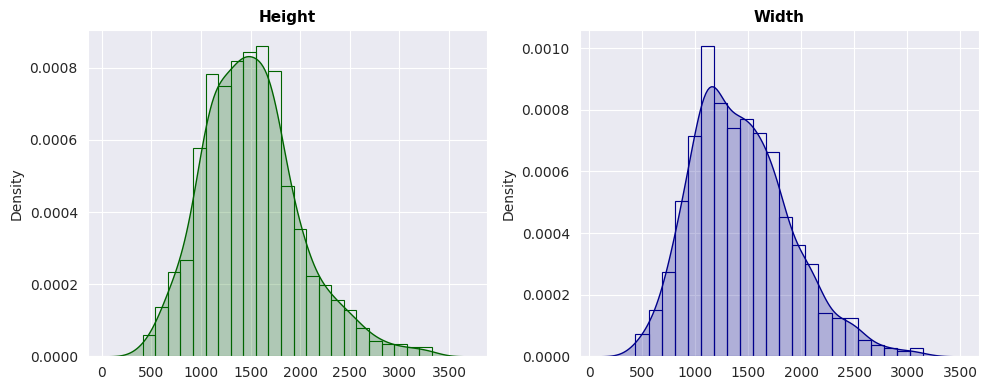

In [ ]:
sns.set_style('darkgrid')
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
sns.kdeplot(height, fill=True, color='darkgreen', ax=axs[0])
sns.histplot(height, stat='density', fill=False, color='darkgreen', ax=axs[0])
axs[0].set_title("Height", fontsize=11, fontweight='bold', color='black')
sns.kdeplot(width, fill=True, color='darkblue', ax=axs[1])
sns.histplot(width, stat='density', fill=False, color='darkblue', ax=axs[1])
axs[1].set_title("Width", fontsize=11, fontweight='bold', color='black')
fig.tight_layout()
plt.show()

In [ ]:
# We convert the image paths and their label into a dataframe.
target = [img_path.parent.stem for img_path in image_path_list]

data = pd.DataFrame({'Image':image_path_list,
                     'Target':target})
data.head()

,Image,Target
0,/content/drive/MyDrive/Data (1)/Original Datas...,Black Spot
1,/content/drive/MyDrive/Data (1)/Original Datas...,Black Spot
2,/content/drive/MyDrive/Data (1)/Original Datas...,Black Spot
3,/content/drive/MyDrive/Data (1)/Original Datas...,Black Spot
4,/content/drive/MyDrive/Data (1)/Original Datas...,Black Spot


In [ ]:
data_train, data_rest = train_test_split(data, test_size=0.3, random_state=SEED)
data_val, data_test = train_test_split(data_rest, test_size=0.5, random_state=SEED)

In [ ]:
data_train['Target'].value_counts()

Target
Fresh Leaf      296
Black Spot      207
Downy Mildew    138
Name: count, dtype: int64

In [ ]:
data_val['Target'].value_counts()

Target
Black Spot      56
Fresh Leaf      51
Downy Mildew    31
Name: count, dtype: int64

In [ ]:
data_test['Target'].value_counts()

Target
Fresh Leaf      57
Black Spot      50
Downy Mildew    31
Name: count, dtype: int64

In [ ]:
# We create a mapper to convert labels to numbers.
label2id = dict(zip(labels, range(len(labels))))
label2id

{'Black Spot': 0, 'Downy Mildew': 1, 'Fresh Leaf': 2}

In [ ]:
class CustomImageDataset(Dataset):
    def __init__(self, data: pd.DataFrame, label2id: dict, transforms=None):
        self.data = data
        self.label2id = label2id
        self.transforms = transforms

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        data_new = self.data.copy()
        data_new['Target'] = data_new['Target'].map(self.label2id)

        image_path = data_new.iloc[idx, 0]
        image = Image.open(image_path).convert("RGB")

        if self.transforms is not None:
            image = self.transforms(image)

        target = data_new.iloc[idx, 1]
        return image, target

In [ ]:
# Load weights and transformations
weights = ResNet50_Weights.DEFAULT
image_transforms = weights.transforms()

In [ ]:
train_dataset = CustomImageDataset(data_train, label2id, image_transforms)

val_dataset = CustomImageDataset(data_val, label2id, image_transforms)

In [ ]:
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count()

train_dataloader = DataLoader(dataset=train_dataset,
                              batch_size=BATCH_SIZE,
                              shuffle=True, num_workers=NUM_WORKERS)
val_dataloader = DataLoader(dataset=val_dataset,
                            batch_size=BATCH_SIZE,
                            shuffle=False, num_workers=NUM_WORKERS)

In [ ]:
# We visualize the dimensions of a batch.
batch_images, batch_labels = next(iter(train_dataloader))

batch_images.shape, batch_labels.shape

(torch.Size([32, 3, 224, 224]), torch.Size([32]))

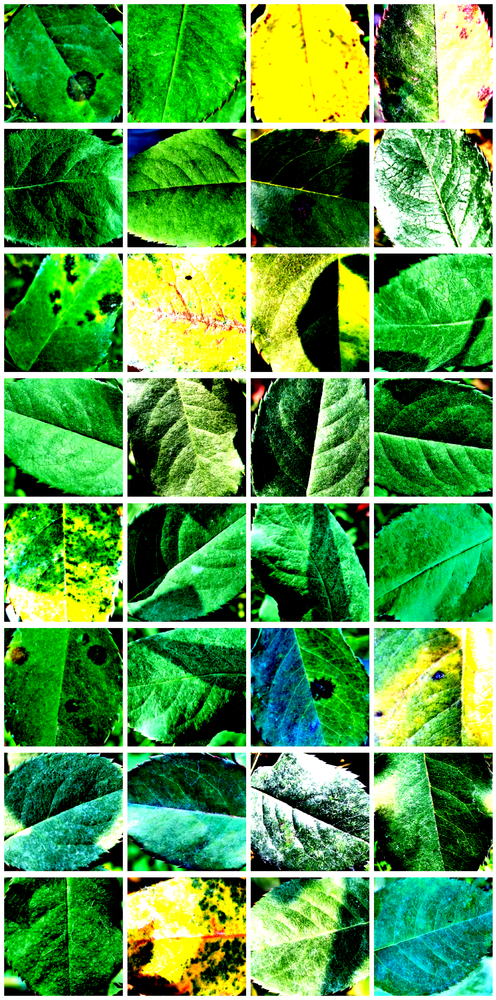

In [ ]:
# We visualize the transformations that were applied.
fig,axs = plt.subplots(nrows = 8, ncols = 4, figsize = (12, 24))
axs = axs.flat

for i,img in enumerate(batch_images):
    image = img.permute(1,2,0)
    axs[i].imshow(image)
    axs[i].axis('off')

fig.tight_layout()
fig.show()

In [ ]:
# GPU
DEVICE = "cuda" if torch.cuda.is_available else "cpu"
DEVICE

'cuda'

In [ ]:
# Define model
model = resnet50(weights=weights)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 179MB/s]


In [ ]:
# Freeze layers
for param in model.parameters():
    param.requires_grad = False

In [ ]:
# Modify the output layer
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, len(labels))

model = model.to(DEVICE)

loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)

In [ ]:
# Early stopping
class EarlyStopping:
    def __init__(self, patience=10, delta=0.0001, path='best_model_resnet.pth'):
        self.patience = patience
        self.delta = delta
        self.path = path
        self.best_score = None
        self.early_stop = False
        self.counter = 0

    def __call__(self, val_loss, model):
        if self.best_score is None:
            self.best_score = val_loss
            self.save_checkpoint(model)
        elif val_loss > self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = val_loss
            self.save_checkpoint(model)
            self.counter = 0

    def save_checkpoint(self, model):
        torch.save(model.state_dict(), self.path)

early_stopping = EarlyStopping(patience=10, delta=0.0)

In [ ]:
early_stopping = EarlyStopping(patience = 10, delta = 0.)

In [ ]:
def train_step(model, dataloader, loss_fn, optimizer):
    model.train()
    train_loss = 0.
    train_accuracy = 0.

    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(DEVICE), y.to(DEVICE)
        optimizer.zero_grad()
        y_pred = model(X)
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()
        loss.backward()
        optimizer.step()

        y_pred_prob = y_pred.softmax(dim=1)
        y_pred_class = y_pred_prob.argmax(dim=1)
        train_accuracy += balanced_accuracy_score(y.cpu().numpy(), y_pred_class.cpu().numpy())

    train_loss /= len(dataloader)
    train_accuracy /= len(dataloader)
    return train_loss, train_accuracy

In [ ]:
def val_step(model, dataloader, loss_fn):
    model.eval()
    val_loss = 0.
    val_accuracy = 0.

    with torch.inference_mode():
        for batch, (X, y) in enumerate(dataloader):
            X, y = X.to(DEVICE), y.to(DEVICE)
            y_pred = model(X)
            loss = loss_fn(y_pred, y)
            val_loss += loss.item()

            y_pred_prob = y_pred.softmax(dim=1)
            y_pred_class = y_pred_prob.argmax(dim=1)
            val_accuracy += balanced_accuracy_score(y.cpu().numpy(), y_pred_class.cpu().numpy())

    val_loss /= len(dataloader)
    val_accuracy /= len(dataloader)
    return val_loss, val_accuracy

In [ ]:
def train(model, train_dataloader, val_dataloader, loss_fn, optimizer, early_stopping, epochs=10):
    results = {'train_loss': [], 'train_accuracy': [], 'val_loss': [], 'val_accuracy': []}

    for epoch in tqdm(range(epochs)):
        train_loss, train_accuracy = train_step(model, train_dataloader, loss_fn, optimizer)
        val_loss, val_accuracy = val_step(model, val_dataloader, loss_fn)

        print(f'Epoch: {epoch + 1} | Train Loss: {train_loss:.4f} | Train Accuracy: {train_accuracy:.4f} | Val Loss: {val_loss:.4f} | Val Accuracy: {val_accuracy:.4f}')

        early_stopping(val_loss, model)

        if early_stopping.early_stop:
            print("Early Stopping!")
            break

        results['train_loss'].append(train_loss)
        results['train_accuracy'].append(train_accuracy)
        results['val_loss'].append(val_loss)
        results['val_accuracy'].append(val_accuracy)

    return results

In [ ]:
EPOCHS = 60
RESULTS = train(model, train_dataloader, val_dataloader, loss_fn, optimizer, early_stopping, EPOCHS)

  0%|          | 0/60 [00:00<?, ?it/s]

Epoch: 1 | Train Loss: 0.8635 | Train Accuracy: 0.5402 | Val Loss: 0.7598 | Val Accuracy: 0.8705
Epoch: 2 | Train Loss: 0.5676 | Train Accuracy: 0.8721 | Val Loss: 0.5998 | Val Accuracy: 0.7661
Epoch: 3 | Train Loss: 0.4690 | Train Accuracy: 0.8229 | Val Loss: 0.5265 | Val Accuracy: 0.8444
Epoch: 4 | Train Loss: 0.3913 | Train Accuracy: 0.9066 | Val Loss: 0.4879 | Val Accuracy: 0.8384
Epoch: 5 | Train Loss: 0.3888 | Train Accuracy: 0.8973 | Val Loss: 0.4776 | Val Accuracy: 0.8455
Epoch: 6 | Train Loss: 0.3280 | Train Accuracy: 0.9133 | Val Loss: 0.4639 | Val Accuracy: 0.8479
Epoch: 7 | Train Loss: 0.3124 | Train Accuracy: 0.9212 | Val Loss: 0.4498 | Val Accuracy: 0.8513
Epoch: 8 | Train Loss: 0.3064 | Train Accuracy: 0.8987 | Val Loss: 0.4216 | Val Accuracy: 0.8328
Epoch: 9 | Train Loss: 0.2684 | Train Accuracy: 0.9503 | Val Loss: 0.3941 | Val Accuracy: 0.8574
Epoch: 10 | Train Loss: 0.2804 | Train Accuracy: 0.8975 | Val Loss: 0.3773 | Val Accuracy: 0.8574
Epoch: 11 | Train Loss: 0.335

In [ ]:
def loss_and_metric_plot(results):
    plt.style.use('ggplot')
    training_loss = results['train_loss']
    training_metric = results['train_accuracy']
    validation_loss = results['val_loss']
    validation_metric = results['val_accuracy']

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(9, 3.8))
    ax = ax.flat

    ax[0].plot(training_loss, 'o-', markersize=4, label="Train")
    ax[0].plot(validation_loss, label="Val")
    ax[0].set_title("CrossEntropyLoss", fontsize=12, fontweight="bold", color="black")
    ax[0].set_xlabel("Epoch", fontsize=10, fontweight="bold", color="black")
    ax[0].set_ylabel("loss", fontsize=10, fontweight="bold", color="black")

    ax[1].plot(training_metric, 'o-', markersize=4, label="Train")
    ax[1].plot(validation_metric, label="Val")
    ax[1].set_title("Balanced Accuracy", fontsize=12, fontweight="bold", color="black")
    ax[1].set_xlabel("Epoch", fontsize=10, fontweight="bold", color="black")
    ax[1].set_ylabel("score", fontsize=10, fontweight="bold", color="black")

    ax[0].legend()
    ax[1].legend()
    fig.tight_layout()
    plt.show()

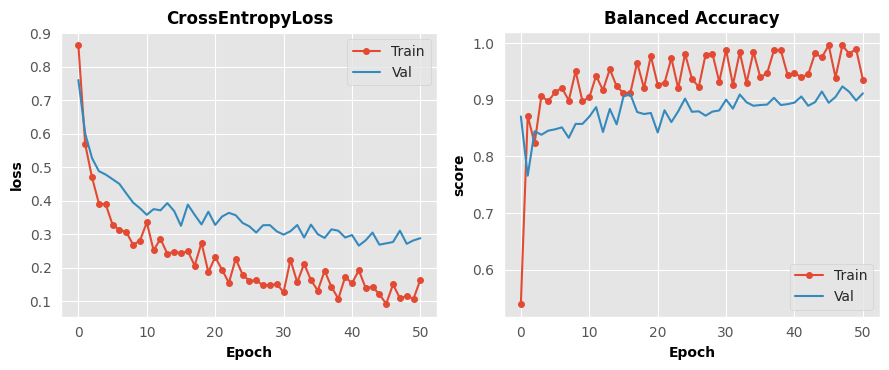

In [ ]:
loss_and_metric_plot(RESULTS)

In [ ]:
test_dataset = CustomImageDataset(data_test, label2id, image_transforms)
test_dataloader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

In [ ]:
def predictions(test_dataloader):
    checkpoint = torch.load("best_model_resnet.pth")

    loaded_model = resnet50()
    num_features = loaded_model.fc.in_features
    loaded_model.fc = nn.Linear(num_features, len(labels))
    loaded_model.load_state_dict(checkpoint)
    loaded_model = loaded_model.to(DEVICE)

    loaded_model.eval()
    y_pred_test = []

    with torch.inference_mode():
        for X, _ in tqdm(test_dataloader):
            X = X.to(DEVICE)
            y_pred = loaded_model(X)
            y_pred_prob = y_pred.softmax(dim=1)
            y_pred_class = y_pred_prob.argmax(dim=1)
            y_pred_test.append(y_pred_class.cpu())

    y_pred_test = torch.cat(y_pred_test)
    return y_pred_test

In [ ]:
# We make the predictions.
y_pred_test = predictions(test_dataloader)

  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
test_bal_accuracy = balanced_accuracy_score(data_test['Target'].map(label2id), y_pred_test.numpy())

print(f"Balanced Accuracy Test = {test_bal_accuracy:.4f}")

Balanced Accuracy Test = 0.9483


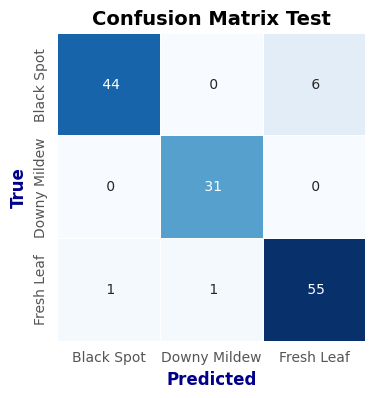

In [ ]:
cf_mx_test = confusion_matrix(data_test['Target'].map(label2id), y_pred_test.numpy())

fig,ax = plt.subplots(figsize = (6,4))
sns.set_style('dark')
sns.heatmap(cf_mx_test, cmap = 'Blues', fmt = ' ', annot = True, cbar = False, square = True, linewidths = 0.4,
            xticklabels = labels, yticklabels = labels, ax = ax)
ax.set_ylabel("True", color = "darkblue", fontsize = 12, fontweight = "bold")
ax.set_xlabel("Predicted", color = "darkblue", fontsize = 12, fontweight = "bold")
ax.set_title("Confusion Matrix Test", fontsize = 14, fontweight = "bold", color = "black")

fig.show()

In [ ]:
print("-" * 60)
print(" " * 20, "Classification report")
print("-" * 60)
print(classification_report(data_test['Target'].map(label2id), y_pred_test.numpy(), target_names = labels))

------------------------------------------------------------
                     Classification report
------------------------------------------------------------
              precision    recall  f1-score   support

  Black Spot       0.98      0.88      0.93        50
Downy Mildew       0.97      1.00      0.98        31
  Fresh Leaf       0.90      0.96      0.93        57

    accuracy                           0.94       138
   macro avg       0.95      0.95      0.95       138
weighted avg       0.94      0.94      0.94       138



In [ ]:
# Draw bounding box
def draw_bounding_box(image_path, label, color=(255, 0, 0), thickness=2):
    img_bgr = cv2.imread(str(image_path))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    h, w, _ = img_rgb.shape
    start_point = (10, 10)
    end_point = (w - 10, h - 10)
    img_rgb = cv2.rectangle(img_rgb, start_point, end_point, color, thickness)
    img_rgb = cv2.putText(img_rgb, label, (start_point[0], start_point[1] - 10),
                          cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2, cv2.LINE_AA)
    return img_rgb

In [ ]:
def visualize_predictions(dataloader, y_pred_test, label2id, num_images=6):
    id2label = {v: k for k, v in label2id.items()}
    fig, axs = plt.subplots(nrows=num_images // 3, ncols=3, figsize=(12, 8))
    axs = axs.flatten()
    indices = random.sample(range(len(y_pred_test)), num_images)

    for ax, idx in zip(axs, indices):
        image, label = dataloader.dataset[idx]
        image_path = dataloader.dataset.data.iloc[idx]['Image']
        label = id2label[y_pred_test[idx].item()]
        img_rgb = draw_bounding_box(image_path, label)
        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(f'Predicted: {label}', color='black')

    fig.tight_layout()
    plt.show()

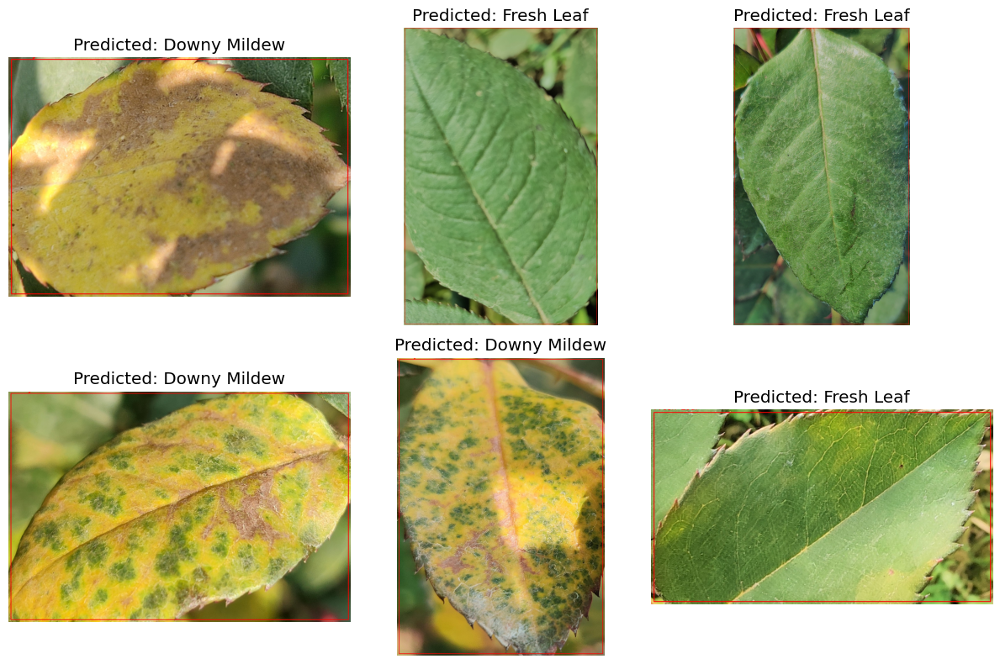

In [ ]:
# Visualize some test predictions
visualize_predictions(test_dataloader, y_pred_test, label2id)

Hasil yang diperoleh Resnet50 untuk memprediksi penyakit daun bunga mawar memiliki akurasi sebesar 94%.